In [3]:
import vaex
import numpy as np
import pandas as pd
import vaex.jupyter.model as vjm
import matplotlib.pyplot as plt

import plotly.graph_objs as go

In [4]:
# how do I get a list of the column names from the vaex dataframe?

In [5]:
%%time
df = pd.read_csv("./example_data/run_GGM_CRlER_norm_st.csv", index_col="Unnamed: 0", float_precision='round_trip')
columns = df.columns
snaptimes = np.array([c.lstrip('R_') for c in columns if 'R_' in c])
print(snaptimes)

# every line is a planet with given period. radius is the initial radius at age 10 Myr, and the R_***** columns are the radii at different ages (which is the variable I want to use the slider on)

df.head()

['1.0e+01' '1.4e+01' '2.1e+01' '3.0e+01' '4.3e+01' '6.2e+01' '8.9e+01'
 '1.3e+02' '1.8e+02' '2.6e+02' '3.8e+02' '5.5e+02' '7.8e+02' '1.1e+03'
 '1.6e+03' '2.3e+03' '3.4e+03' '4.8e+03' '7.0e+03' '1.0e+04']
CPU times: user 1.9 s, sys: 46.2 ms, total: 1.95 s
Wall time: 1.95 s


,a,period,core_mass,core_radius,fenv,mass,radius,age,t_eq,Lx0,...,beta0_1.0e+04,beta_1.0e+04,Mdot0_1.0e+04,Mdot0_1.0e+04M_earth_per_Gyr,Mdot0_1.0e+04M_earth_per_yr,Mdot_1.0e+04,Mdot_1.0e+04M_earth_per_Gyr,Mdot_1.0e+04M_earth_per_yr,t_ML_1.0e+04_Myr,t_ML_1.0e+04_Gyr
planet_0788,0.112639,13.317729,12.689014,1.975748,10.185638,14.128046,4.983004,10.0,896.291991,9.612899e+29,...,1.292375,1.196819,1.522023e+11,0.803677,8.036767e-10,1.615018e+08,0.000853,8.527814e-13,1.605022e+06,1605.022243
planet_4404,0.366166,72.851872,3.188877,1.342117,4.623543,3.343463,3.779668,10.0,579.773855,5.344089e+30,...,1.636918,1.363947,1.883975e+11,0.994799,9.947989e-10,3.895609e+07,0.000206,2.057006e-13,5.050548e+05,505.054787
planet_1867,0.069655,6.497559,2.017214,1.180599,0.828645,2.034069,2.954967,10.0,1133.329901,2.667003e+30,...,2.600374,1.580765,6.451294e+12,34.064899,3.406490e-08,1.315217e+11,0.694477,6.944767e-10,0.000000e+00,0.000000
planet_4219,0.263565,51.507859,4.586966,1.485932,5.645340,4.861409,3.925586,10.0,480.787289,4.663488e+29,...,1.371159,1.225119,2.091082e+10,0.110416,1.104158e-10,1.670267e+07,0.000088,8.819545e-14,3.021322e+06,3021.322149
planet_0077,0.241868,39.665684,4.742179,1.499842,5.534923,5.020034,3.998239,10.0,689.454406,4.659397e+30,...,1.525100,1.328834,2.641110e+11,1.394591,1.394591e-09,7.791274e+07,0.000411,4.114042e-13,5.642776e+05,564.277596


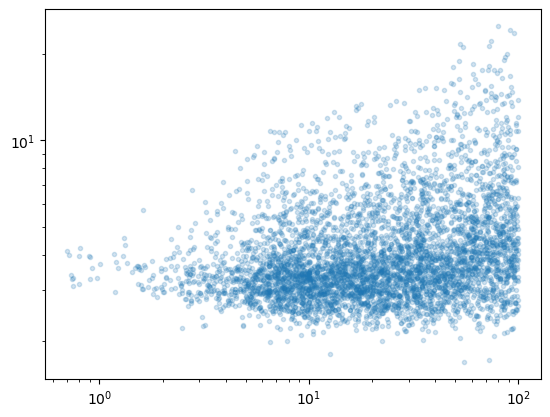

CPU times: user 2.68 s, sys: 113 ms, total: 2.79 s
Wall time: 2.71 s


In [6]:
%%time
df = vaex.from_csv("./example_data/run_GGM_CRlER_norm_st.csv")
df.head()

# Define the axes
extend = 50
x_axis = vjm.Axis(df=df, expression=df.period, shape=100, min=-extend, max=extend)
y_axis = vjm.Axis(df=df, expression=df.radius, shape=100, min=-extend, max=extend)
# in this case we need to know the min and max 
# directly
#await vaex.jupyter.gather()

fig, ax = plt.subplots()
ax.plot(df.period.values, df.radius.values, '.', alpha=0.2)
ax.set_yscale('log')
ax.set_xscale('log')
plt.show()

In [6]:
import plotly.graph_objects as go
import numpy as np

ylim = (0.5, np.max(df['radius'].values))

figure_height, figure_width = 700, 950
title = 'Time evo planet population'

layout = go.Layout(height=figure_height,
                    width=figure_width,
                    title=title,
                    xaxis=go.layout.XAxis(range=[np.min(df['period'].values), np.max(df['period'].values)]),
                    yaxis=go.layout.YAxis(range=[ylim[0], ylim[1]])
                    ) #title=str(y_axis.expression)
                    

# Create figure
fig = go.Figure(layout=layout)

# Add traces, one for each slider step
for step in snaptimes: #np.arange(1, 10, 1):
    fig.add_trace(
        go.Scatter( 
            visible=False,
            name="𝜈 = " + str(step),
            x=df['period'].values,
            y=df['R_'+step].values),
        )

# Make 10th trace visible
fig.data[0].visible = True


# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Slider switched to step: " + snaptimes[i] + ' Myr'}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=0,
    currentvalue={"prefix": "Age [Myr]: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

fig.update_xaxes(title_text='Period [days]', type="log", range=[np.log10(np.min(df['period'].values)), np.log10(np.max(df['period'].values))])
fig.update_yaxes(title_text='Radius [R_Earth]', type="log", range=[np.log10(ylim[0]), np.log10(ylim[1])])
fig.update_traces(mode='markers', opacity=0.75, 
            marker=dict(
                color="rgba(152, 0, 0, .8)",##00CED1
                size=5,
                line=dict(
                    color='Black',
                    width=0.5
                )
            ),
)


fig.show()


In [7]:
# set up the plot
ylim = (0.5, np.max(df['radius'].values))
figure_height, figure_width = 700, 950
title = 'Time evo planet population'

layout = go.Layout(height=figure_height,
                    width=figure_width,
                    title=title,
                    xaxis=go.layout.XAxis(range=[np.min(df['period'].values), np.max(df['period'].values)]),
                    yaxis=go.layout.YAxis(range=[ylim[0], ylim[1]])
                    ) #title=str(y_axis.expression)
                    


# Create figure
fig = go.Figure(layout=layout)

# Add traces, one for each slider step
for step in snaptimes: #np.arange(1, 10, 1):
    fig.add_trace(go.Scatter( 
            #visible=False,
            #name="𝜈 = " + str(step),
            x=df['period'].values,
            y=df['R_'+step].values,
            marker=dict(
                size=15,
                cmax=np.max(np.log10(df['M_'+step].values)),
                cmin=np.min(np.log10(df['M_'+step].values)),
                color=np.log10(df['M_'+step].values),
                colorbar=dict(
                    title="Colorbar"
                ),
                colorscale="Turbo"
            ),
            mode="markers",
        ))

# Make 10th trace visible
fig.data[0].visible = True


# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Slider switched to step: " + snaptimes[i] + ' Myr'}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=0,
    currentvalue={"prefix": "Age [Myr]: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

fig.update_xaxes(title_text='Period [days]', type="log", range=[np.log10(np.min(df['period'].values)), np.log10(np.max(df['period'].values))])
fig.update_yaxes(title_text='Radius [R_Earth]', type="log", range=[np.log10(ylim[0]), np.log10(ylim[1])])
fig.update_traces(mode='markers', opacity=0.75, 
            marker=dict(
            #    color="rgba(152, 0, 0, .8)",##00CED1
                size=5,
                line=dict(
                    color='Black',
                    width=0.5
                )
            ),
)


fig.show()
